In [1]:
# pip install squarify

In [2]:
# pip install wordcloud matplotlib

# **1. Data Preparation (Comments)**

In [3]:
import matplotlib.pyplot as plt
import squarify
import pandas as pd
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer

# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
# Create dataframe
# df_comments = pd.read_csv('/content/drive/MyDrive/Carwow-Youtube-Analysis/Notebook/preprocessed_df_comments.csv')
df_comments = pd.read_csv('../Copy of Youtube Analysis/comments_sentimented.csv')
df_comments.info()
df_comments.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75832 entries, 0 to 75831
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   title               75832 non-null  object
 1   text                75832 non-null  object
 2   preprocessed_text   73552 non-null  object
 3   sentiment_score     75832 non-null  int64 
 4   sentiment_score_2   75832 non-null  int64 
 5   sentiment_category  75832 non-null  object
dtypes: int64(2), object(4)
memory usage: 3.5+ MB


,title,text,preprocessed_text,sentiment_score,sentiment_score_2,sentiment_category
0,How Donald Trump’s Attempted Assassination Unf...,For the latest reporting on the story from WSJ...,latest reporting story wsj visit,5,4,positive
1,How Donald Trump’s Attempted Assassination Unf...,WSJ is part the reason this occurred. Your opi...,wsj part reason occurred opinion pieces claimi...,1,1,negative
2,How Donald Trump’s Attempted Assassination Unf...,This was the plot to the movie Machete,plot movie machete,1,5,neutral
3,How Donald Trump’s Attempted Assassination Unf...,@TheCorruptionKing \nSi \n😊😊\n😊.,si,3,5,positive
4,How Donald Trump’s Attempted Assassination Unf...,Amerika derin devleti,amerika derin devleti,5,5,positive


In [5]:
value_counts = df_comments['sentiment_category'].value_counts()
value_counts

negative    42049
positive    18058
neutral     15725
Name: sentiment_category, dtype: int64

In [6]:
# Function to map sentiment categories to colors
def map_colors(category):
    if category == 'positive':
        return 'green'
    elif category == 'negative':
        return 'red'
    elif category == 'neutral':
        return 'grey'

# Apply the color mapping function
df_comments['color'] = df_comments['sentiment_category'].apply(map_colors)
df_comments

,title,text,preprocessed_text,sentiment_score,sentiment_score_2,sentiment_category,color
0,How Donald Trump’s Attempted Assassination Unf...,For the latest reporting on the story from WSJ...,latest reporting story wsj visit,5,4,positive,green
1,How Donald Trump’s Attempted Assassination Unf...,WSJ is part the reason this occurred. Your opi...,wsj part reason occurred opinion pieces claimi...,1,1,negative,red
2,How Donald Trump’s Attempted Assassination Unf...,This was the plot to the movie Machete,plot movie machete,1,5,neutral,grey
3,How Donald Trump’s Attempted Assassination Unf...,@TheCorruptionKing \nSi \n😊😊\n😊.,si,3,5,positive,green
4,How Donald Trump’s Attempted Assassination Unf...,Amerika derin devleti,amerika derin devleti,5,5,positive,green
...,...,...,...,...,...,...,...
75827,WATCH: Moment Trump appears to be shot at rally,@johnathancampbell1056 HE WENT THROUGH THE I...,went initiation true felon,5,5,positive,green
75828,WATCH: Moment Trump appears to be shot at rally,@Iammusprase384 well he’s gonna be a real fe...,well hes gonna real felon president,5,1,neutral,grey
75829,WATCH: Moment Trump appears to be shot at rally,"@jacksonayckbourn1239 AT RIKERS, THIS FELON ...",rikers felon jus started feel effects,5,1,neutral,grey
75830,WATCH: Moment Trump appears to be shot at rally,@Iammusprase384 womp womp stay mad loser,womp womp stay mad loser,1,1,negative,red


# **2. EDA**

## **Sentiment Distribution**

In [7]:
# import plotly.express as px

# # Define color mapping
# color_map = {
#     'positive': 'green',
#     'neutral': 'grey',
#     'negative': 'red'
# }

# # Treemap Grouped by sentiment_category
# fig1 = px.treemap(df_comments,
#                   path=['sentiment_category'],
#                   color='sentiment_category',
#                   color_discrete_map=color_map,
#                   title="Treemap of Sentiment Categories",
#                   width=1920,  # Adjust the width
#                   height=1080)  # Adjust the height
# # Update traces for text properties
# fig1.update_traces(
#     texttemplate="<b>%{label}</b>",  # Make text bold
#     textfont_size=18  # Increase font size
# )

# fig1.show()

In [8]:
# Aggregate data to get overall sentiment counts
overall_sentiment = df_comments.groupby(['sentiment_category', 'color']).size().reset_index(name='Count')
overall_sentiment

,sentiment_category,color,Count
0,negative,red,42049
1,neutral,grey,15725
2,positive,green,18058


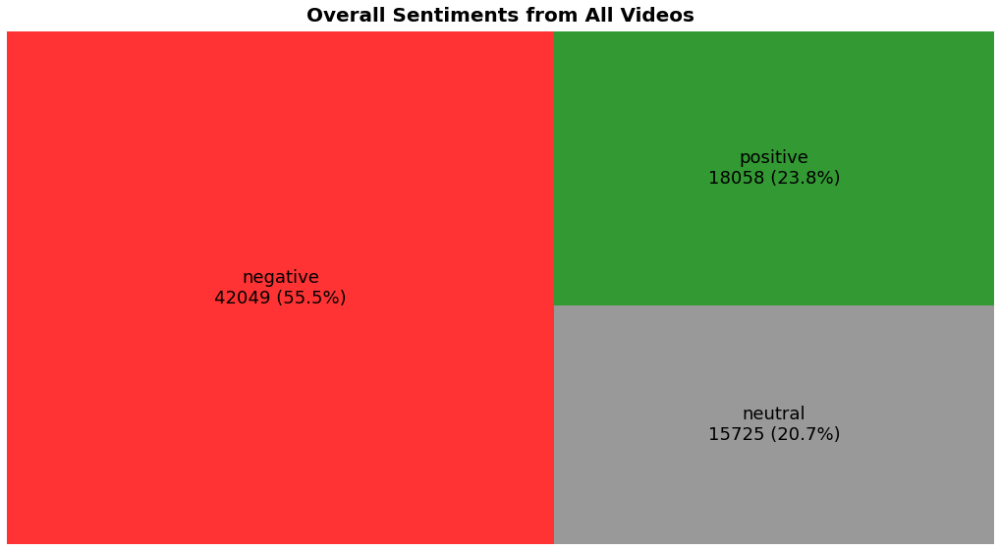

In [53]:
# Define the sizes and labels for the treemap
sizes_overall = overall_sentiment['Count']
total = sizes_overall.sum()
labels_overall = [f"{category}\n{count} ({count/total:.1%})" for category, count in zip(overall_sentiment['sentiment_category'], overall_sentiment['Count'])]
colors = overall_sentiment['color']  # Use the mapped colors

# Create the treemap
plt.figure(figsize=(18, 10))
squarify.plot(
    sizes=sizes_overall, 
    label=labels_overall, 
    color=colors, 
    alpha=0.8, 
    text_kwargs={'fontsize': 18}
)
# Turn off the axes to remove the ticks and markers
plt.axis('off')
# Add title with spacing
plt.title('Overall Sentiments from All Videos', fontsize=20, fontweight='bold', pad=10)
# Adjust space around the plot (add space under the title)
plt.subplots_adjust(top=0.85)
plt.show()

In [10]:
# Group the data by title and sentiment_category, then count occurrences
grouped_sentiment = df_comments.groupby(['title', 'sentiment_category', 'color']).size().reset_index(name='Count')
grouped_sentiment

,title,sentiment_category,color,Count
0,How Donald Trump’s Attempted Assassination Unf...,negative,red,2050
1,How Donald Trump’s Attempted Assassination Unf...,neutral,grey,762
2,How Donald Trump’s Attempted Assassination Unf...,positive,green,706
3,How the Attempted Assassination of Donald Trum...,negative,red,3699
4,How the Attempted Assassination of Donald Trum...,neutral,grey,1449
5,How the Attempted Assassination of Donald Trum...,positive,green,1471
6,New video shows Trump shooter climbing onto th...,negative,red,4180
7,New video shows Trump shooter climbing onto th...,neutral,grey,1461
8,New video shows Trump shooter climbing onto th...,positive,green,1316
9,Shots fired at Trump rally,negative,red,19467


## **Wordcloud Unigram and Bigram**

In [11]:
# Wordcloud (Unigram)
def generate_sentiment_word_clouds(df, ngram):
    def generate_word_cloud(text, title, sentiment):
        
        # Custom color function based on sentiment category
        def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
            if sentiment == 'positive':
                return "green"
            elif sentiment == 'negative':
                return "red"
            elif sentiment == 'neutral':
                return "grey"
        
        wordcloud = WordCloud(width=1000, height=1000, background_color='white', color_func=color_func).generate(text)

        plt.figure(figsize=(18, 18))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(title, fontsize=30, fontweight='bold', pad=20, color='black')
        plt.axis('off')
        plt.show()

    # Convert 'preprocessed_text' column to strings to handle potential float values
    df['preprocessed_text'] = df['preprocessed_text'].astype(str)

    # Function to generate bigrams
    def generate_bigrams(text):
        # Initialize the CountVectorizer with bigram range and English stop words
        vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english')

        # Fit and transform the text to get bigrams
        bigrams = vectorizer.fit_transform([text])

        # Get the feature names (bigrams)
        feature_names = vectorizer.get_feature_names()

        # Join the bigrams into a single string
        return ' '.join(feature_names)

    if ngram == 'uni':
        positive_text = ' '.join(df[df['sentiment_category'] == 'positive']['preprocessed_text'])
        neutral_text = ' '.join(df[df['sentiment_category'] == 'neutral']['preprocessed_text'])
        negative_text = ' '.join(df[df['sentiment_category'] == 'negative']['preprocessed_text'])

    if ngram == 'bi':
        positive_text = generate_bigrams(' '.join(df[df['sentiment_category'] == 'positive']['preprocessed_text']))
        neutral_text = generate_bigrams(' '.join(df[df['sentiment_category'] == 'neutral']['preprocessed_text']))
        negative_text = generate_bigrams(' '.join(df[df['sentiment_category'] == 'negative']['preprocessed_text']))

    generate_word_cloud(positive_text, 'Positive', 'positive')
    generate_word_cloud(neutral_text, 'Neutral', 'neutral')
    generate_word_cloud(negative_text, 'Negative', 'negative')

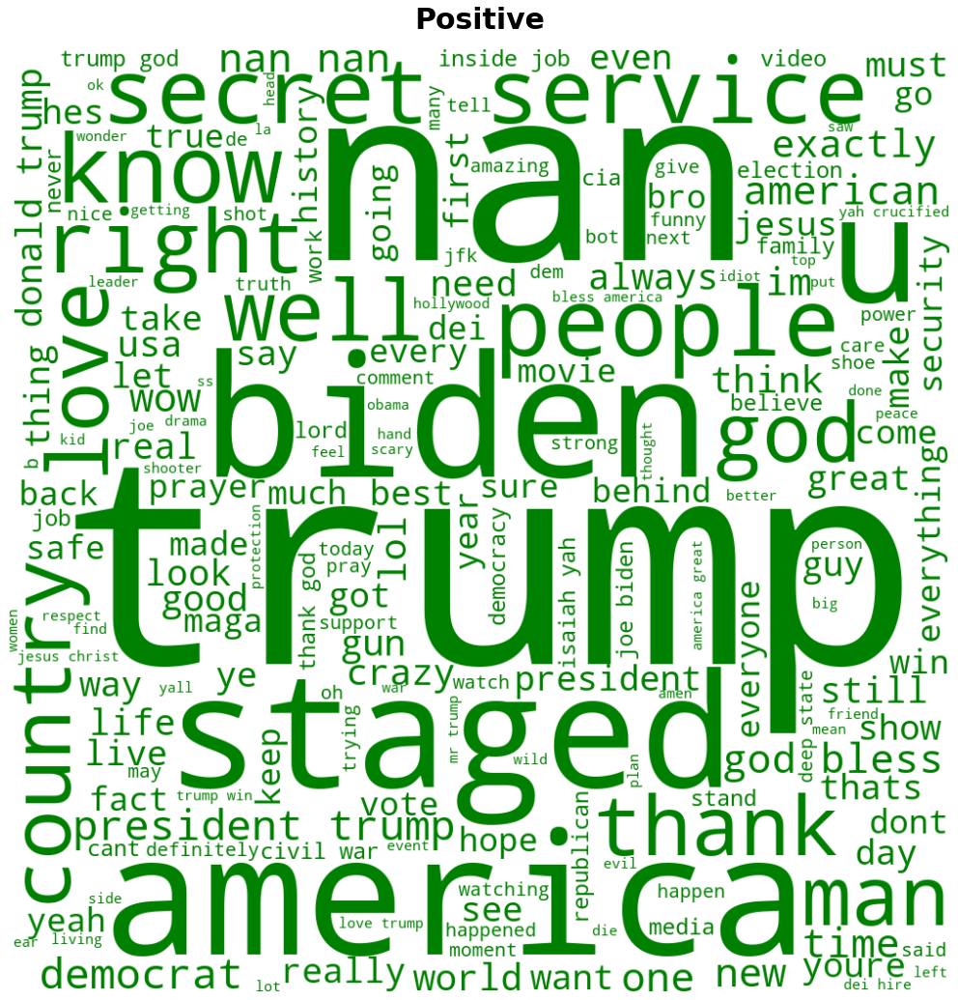

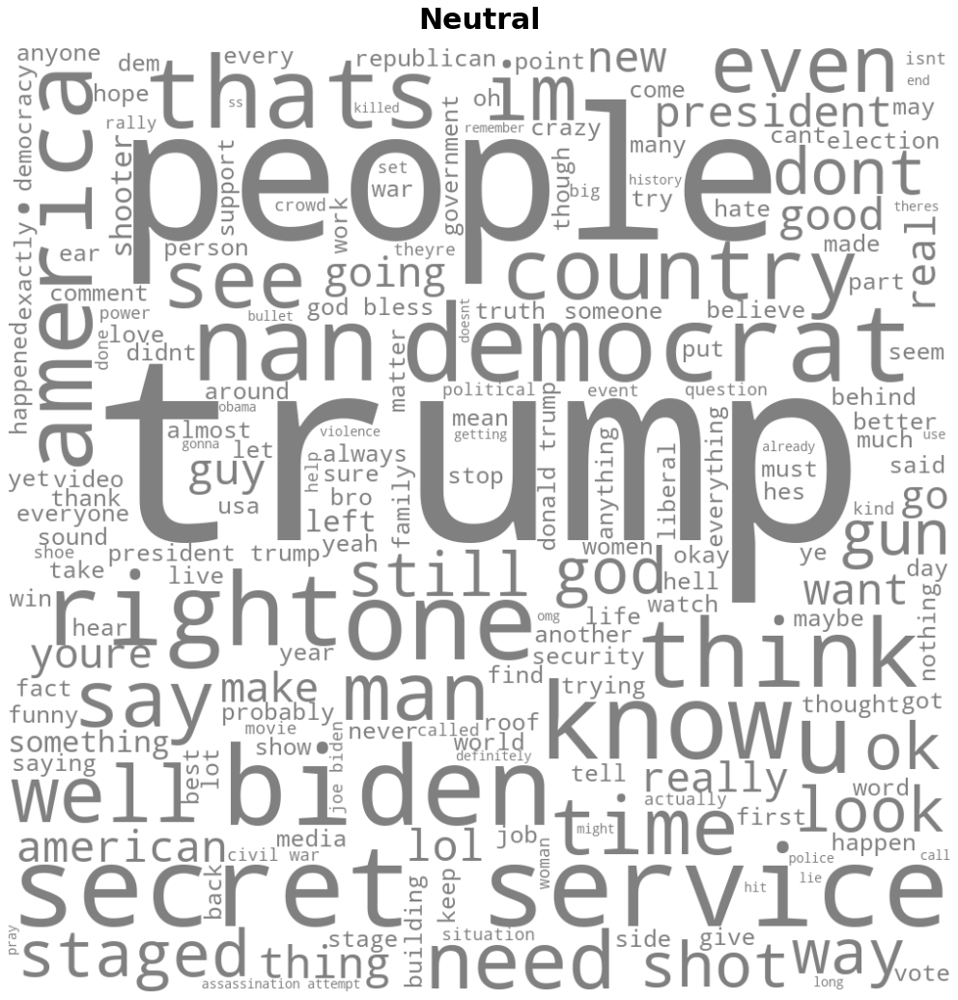

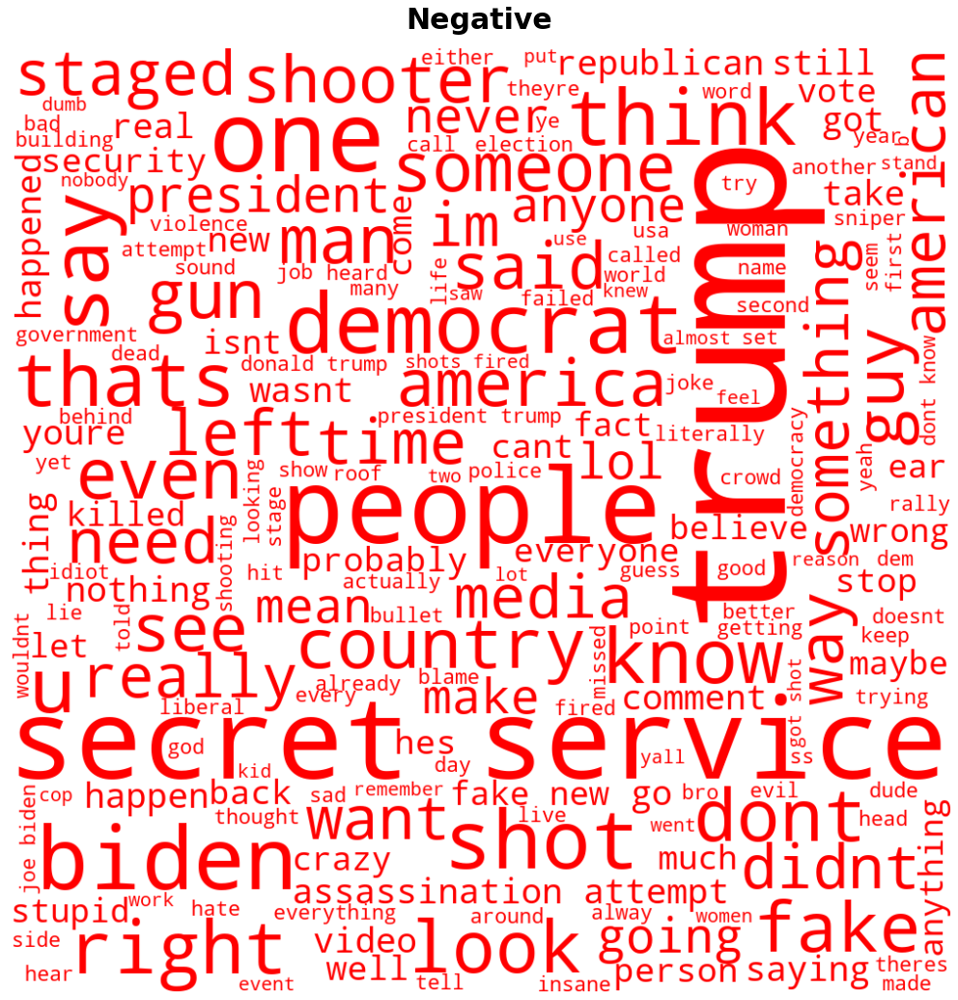

In [12]:
# Wordcloud (Unigram)
generate_sentiment_word_clouds(df_comments, 'uni')

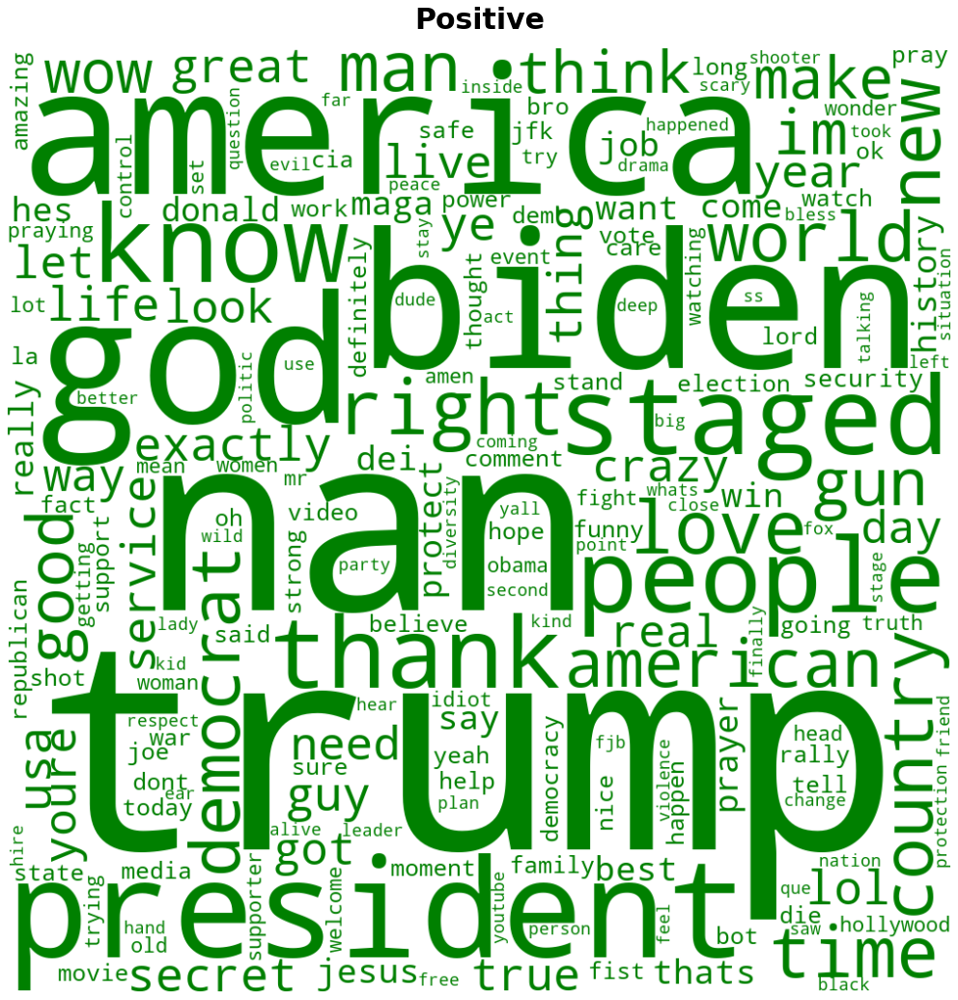

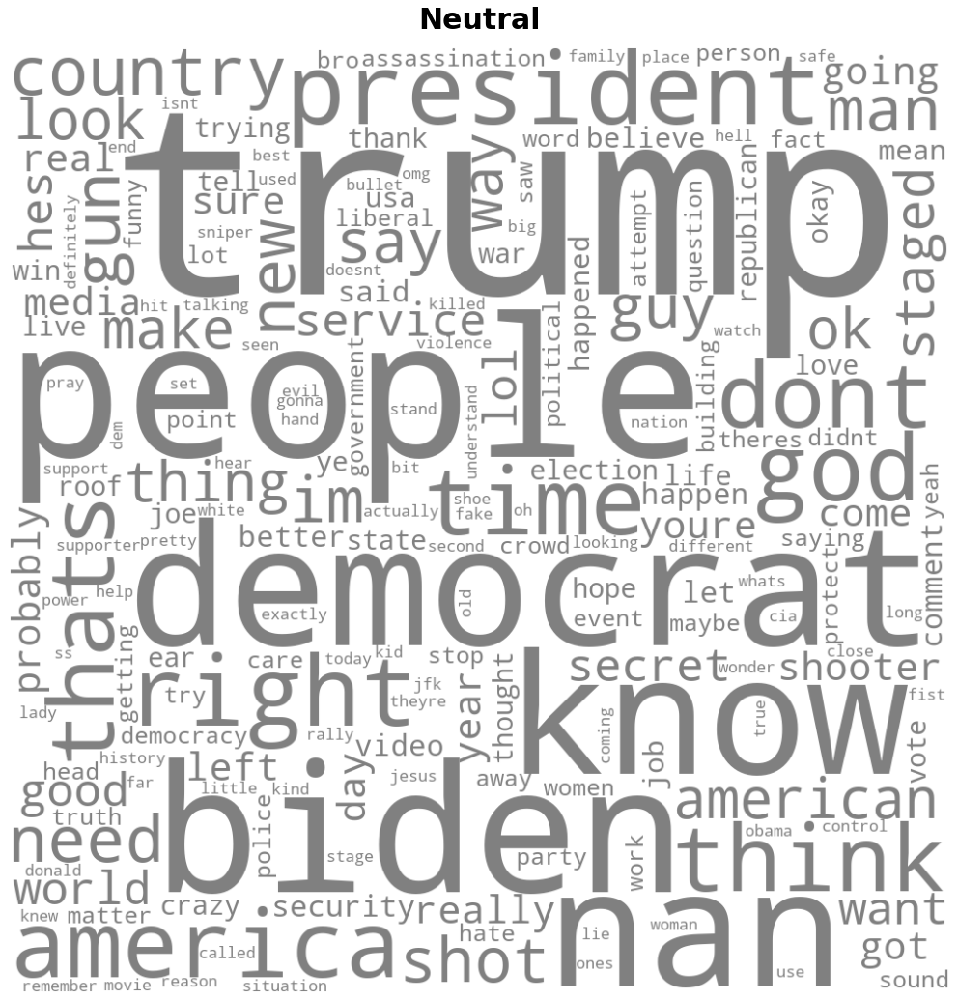

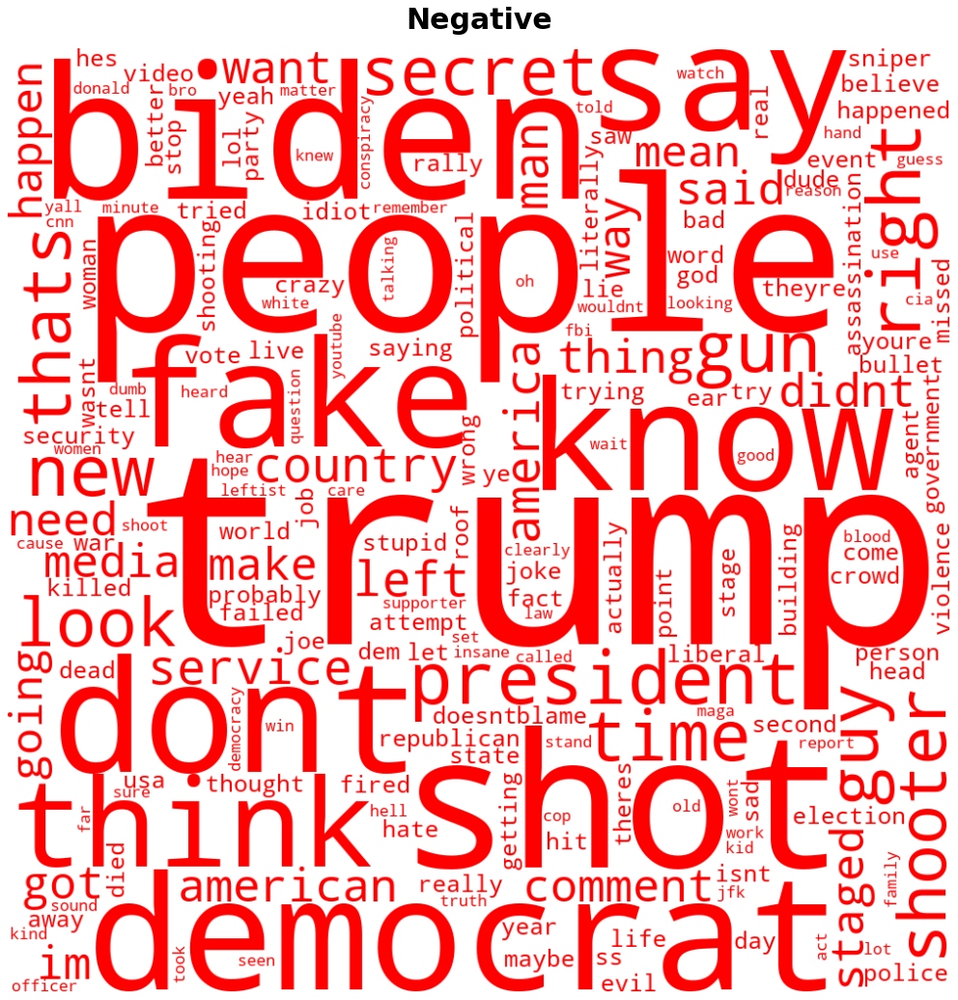

In [13]:
# Wordcloud (Bigram)
generate_sentiment_word_clouds(df_comments, 'bi')

In [14]:
from collections import Counter

# Function to extract and count unigrams
def count_unigrams(text_series, n_most_common=20):
    # Use CountVectorizer to extract unigrams
    vectorizer = CountVectorizer(stop_words='english')  # Default ngram_range is (1, 1) for unigrams
    unigrams = vectorizer.fit_transform(text_series)

    # Get feature names (unigrams) and their counts
    feature_names = vectorizer.get_feature_names()
    unigram_counts = unigrams.sum(axis=0).A1

    # Create a dictionary of unigrams and their counts
    unigram_counter = dict(zip(feature_names, unigram_counts))

    # Get the most common unigrams
    most_common_unigrams = Counter(unigram_counter).most_common(n_most_common)

    return most_common_unigrams

# Function to extract and count bigrams
def count_bigrams(text_series, n_most_common=20):
    # Use CountVectorizer to extract bigrams
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english')
    bigrams = vectorizer.fit_transform(text_series)

    # Get feature names (bigrams) and their counts
    feature_names = vectorizer.get_feature_names()
    bigram_counts = bigrams.sum(axis=0).A1

    # Create a dictionary of bigrams and their counts
    bigram_counter = dict(zip(feature_names, bigram_counts))

    # Get the most common bigrams
    most_common_bigrams = Counter(bigram_counter).most_common(n_most_common)

    return most_common_bigrams

### Positive wordcount

In [15]:
# Positive Comment
# Example usage
most_common_unigrams = count_unigrams(df_comments[df_comments['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

trump: 2854 occurrences
nan: 1701 occurrences
god: 934 occurrences
president: 714 occurrences
america: 660 occurrences
biden: 574 occurrences
like: 535 occurrences
staged: 522 occurrences
people: 386 occurrences
secret: 378 occurrences
service: 367 occurrences
know: 365 occurrences
country: 342 occurrences
love: 340 occurrences
world: 337 occurrences
right: 320 occurrences
thank: 320 occurrences
man: 303 occurrences
im: 289 occurrences
donald: 279 occurrences


In [16]:
# Positive Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(df_comments[df_comments['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

secret service: 336 occurrences
president trump: 244 occurrences
god bless: 240 occurrences
donald trump: 197 occurrences
inside job: 91 occurrences
isaiah yah: 90 occurrences
civil war: 82 occurrences
thank god: 80 occurrences
joe biden: 77 occurrences
trump trump: 77 occurrences
deep state: 75 occurrences
trump president: 65 occurrences
trump god: 64 occurrences
yah crucified: 60 occurrences
god protect: 55 occurrences
jesus christ: 55 occurrences
love trump: 55 occurrences
america great: 54 occurrences
bless america: 54 occurrences
mr trump: 54 occurrences


### Neutral wordcount

In [17]:
# neutral Comment
# Example usage
most_common_unigrams = count_unigrams(df_comments[df_comments['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

trump: 2306 occurrences
like: 1023 occurrences
people: 883 occurrences
president: 724 occurrences
biden: 652 occurrences
service: 614 occurrences
secret: 610 occurrences
god: 605 occurrences
nan: 581 occurrences
dont: 576 occurrences
know: 561 occurrences
thats: 487 occurrences
right: 484 occurrences
america: 477 occurrences
im: 452 occurrences
country: 423 occurrences
think: 423 occurrences
democrats: 415 occurrences
time: 382 occurrences
hes: 367 occurrences


In [18]:
# Neutral Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(df_comments[df_comments['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

secret service: 565 occurrences
president trump: 203 occurrences
donald trump: 149 occurrences
god bless: 135 occurrences
civil war: 88 occurrences
joe biden: 87 occurrences
assassination attempt: 84 occurrences
dont know: 70 occurrences
looks like: 66 occurrences
fatal wound: 64 occurrences
followed beast: 61 occurrences
wound healed: 61 occurrences
gun control: 57 occurrences
healed earth: 53 occurrences
jesus christ: 53 occurrences
deep state: 49 occurrences
fatally wounded: 48 occurrences
united states: 48 occurrences
im sure: 47 occurrences
amazed followed: 46 occurrences


### Negative wordcount

In [19]:
# negative Comment
# Example usage
most_common_unigrams = count_unigrams(df_comments[df_comments['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

trump: 9157 occurrences
people: 4270 occurrences
like: 3879 occurrences
dont: 3219 occurrences
secret: 3133 occurrences
service: 3081 occurrences
biden: 2549 occurrences
fake: 2440 occurrences
shot: 2261 occurrences
know: 2065 occurrences
president: 1967 occurrences
think: 1836 occurrences
news: 1713 occurrences
right: 1670 occurrences
staged: 1626 occurrences
democrats: 1569 occurrences
im: 1499 occurrences
didnt: 1475 occurrences
thats: 1473 occurrences
shooter: 1460 occurrences


In [20]:
# Negative Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(df_comments[df_comments['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

secret service: 2930 occurrences
assassination attempt: 640 occurrences
fake news: 505 occurrences
president trump: 457 occurrences
donald trump: 443 occurrences
dont know: 437 occurrences
joe biden: 326 occurrences
shots fired: 301 occurrences
looks like: 295 occurrences
got shot: 276 occurrences
dont like: 240 occurrences
god bless: 235 occurrences
civil war: 222 occurrences
dont want: 209 occurrences
like trump: 199 occurrences
dont think: 186 occurrences
sounds like: 175 occurrences
registered republican: 161 occurrences
deep state: 160 occurrences
vote trump: 156 occurrences


# **3. Keyword Hunting**

## **word 1: inside job**

In [21]:
word_to_search = 'inside job'
filtered_df_1 = df_comments[df_comments['preprocessed_text'].str.contains(word_to_search)][['text','preprocessed_text', 'sentiment_category']]
filtered_df_1

,text,preprocessed_text,sentiment_category
26,Inside job. The political left the so-called D...,inside job political left socalled democrats t...,negative
249,Nothing about this makes any sense.\n\nThe she...,nothing makes sense sheer incompetence screams...,negative
292,Inside Job ;),inside job,positive
295,Inside job.,inside job,positive
367,Inside job,inside job,positive
...,...,...,...
71750,This was an inside job. He wants to be seen as...,inside job wants seen victim hed anything secure,neutral
71771,😂😂🤷🏾‍♂️ sooo im going to state the obvious. No...,sooo im going state obvious noooo one saw snip...,negative
72554,Smells like cia inside job source jfk history,smells like cia inside job source jfk history,negative
74378,​@hazeboy8981 not a change.. this is an inside...,change inside job get rid trump buddy like jfk...,negative


In [22]:
df_comments[df_comments['preprocessed_text'].str.contains(word_to_search)]['sentiment_category'].value_counts()

negative    92
positive    91
neutral     44
Name: sentiment_category, dtype: int64

### Wordcloud

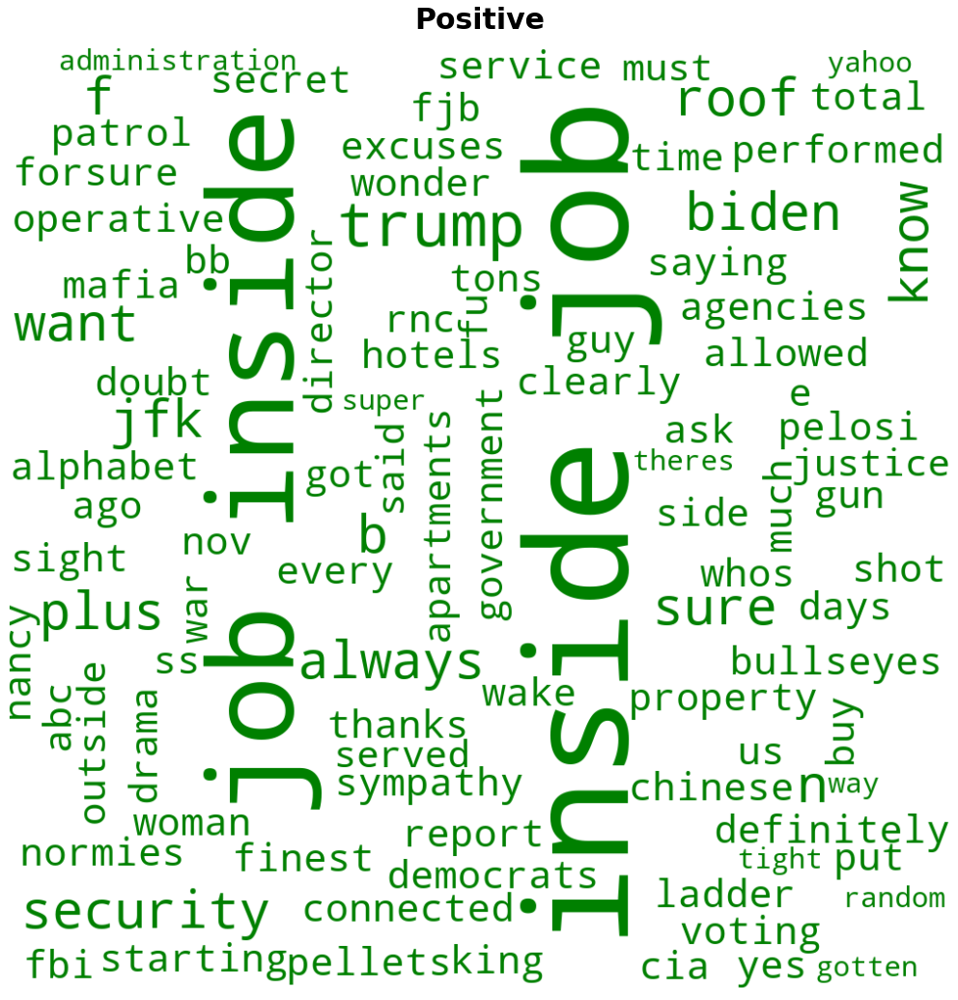

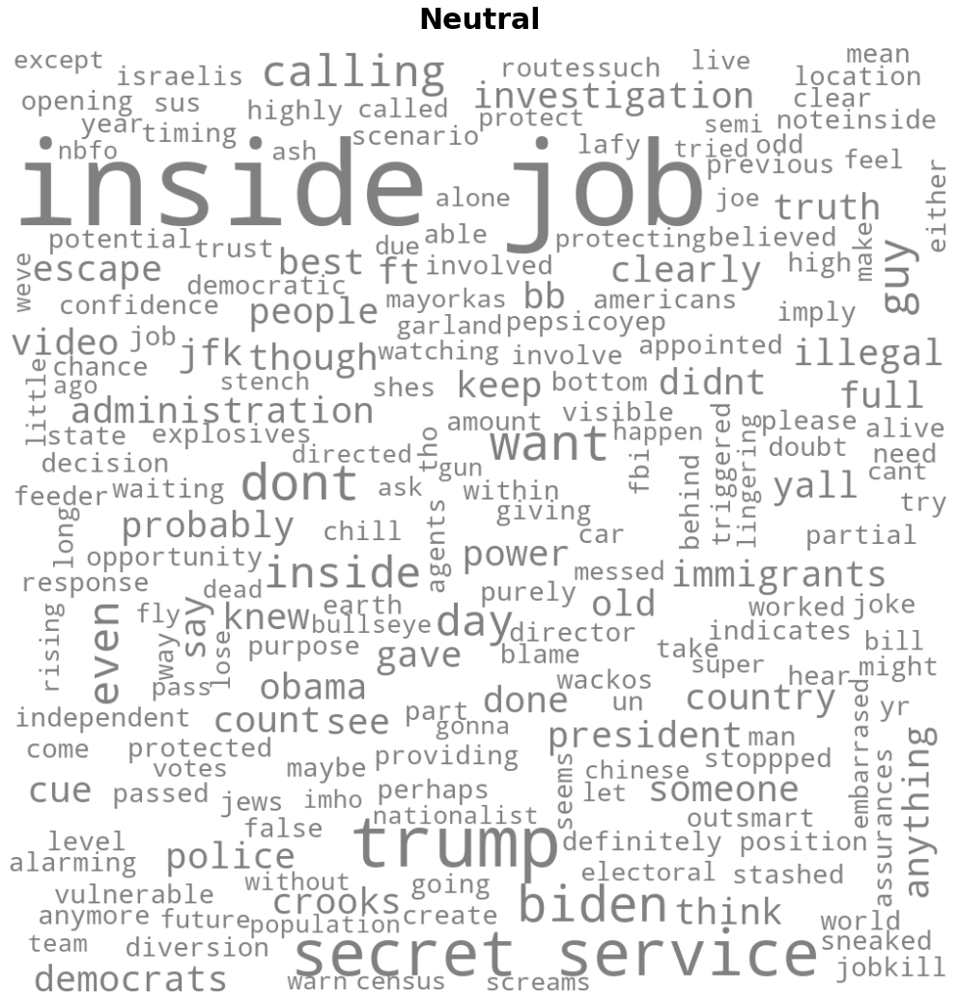

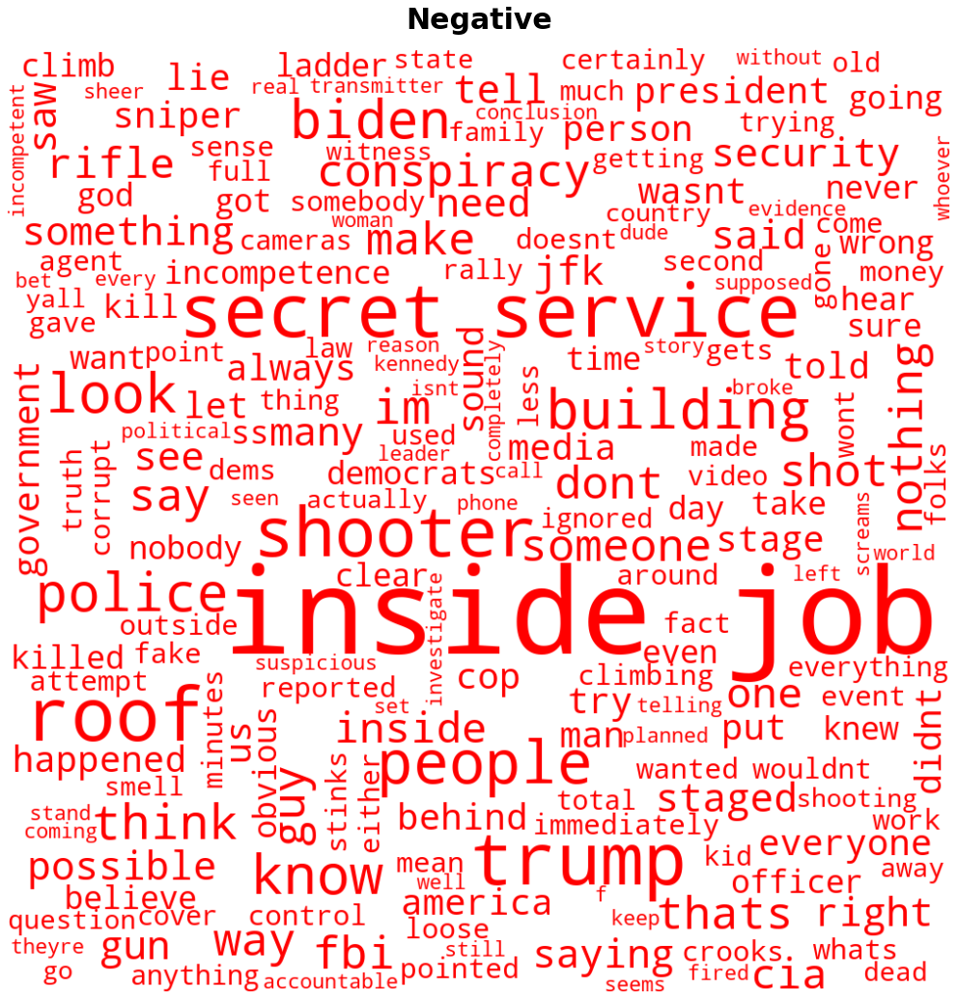

In [23]:
# Wordcloud (Unigram)
generate_sentiment_word_clouds(filtered_df_1, 'uni')

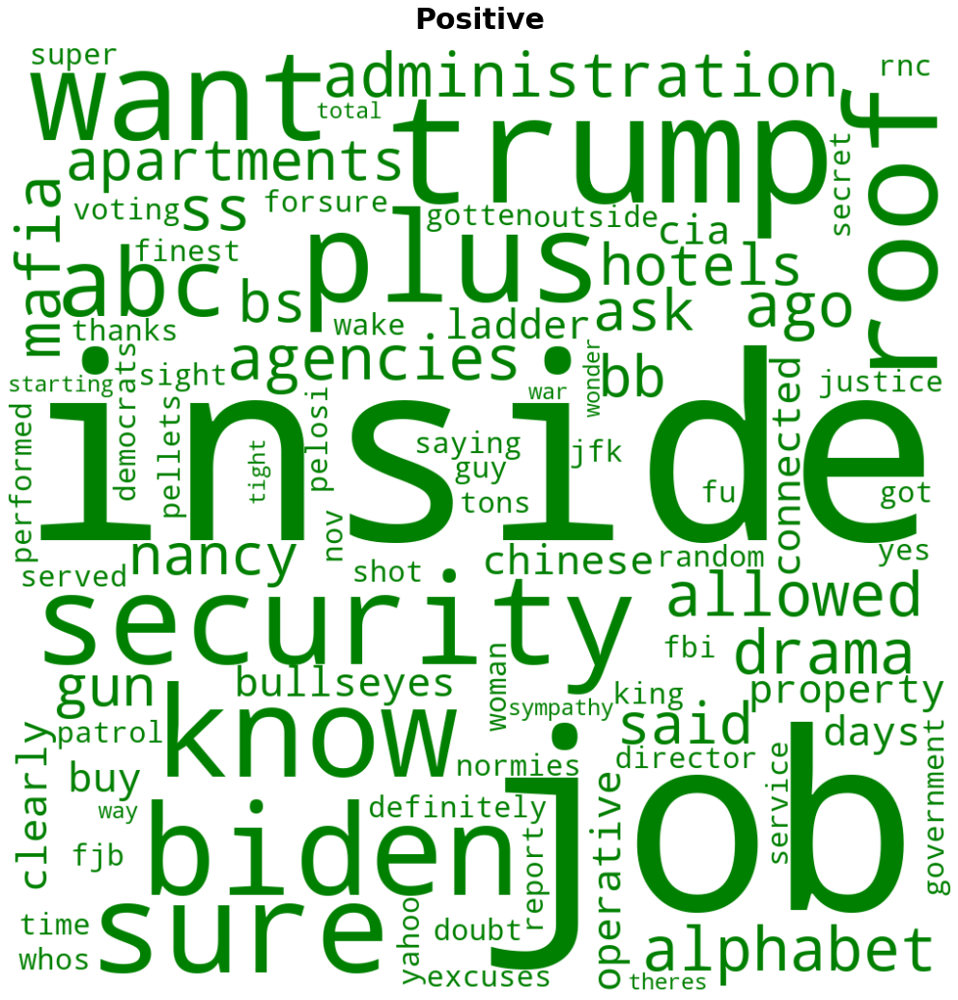

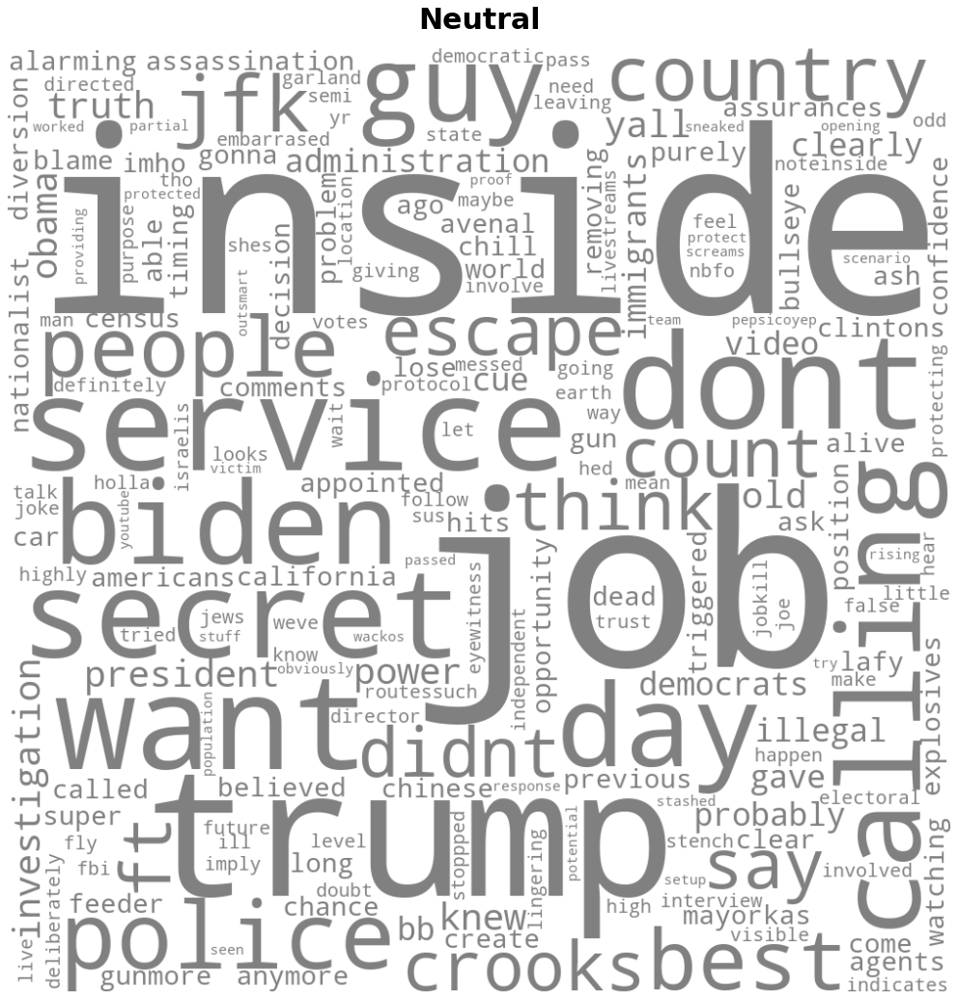

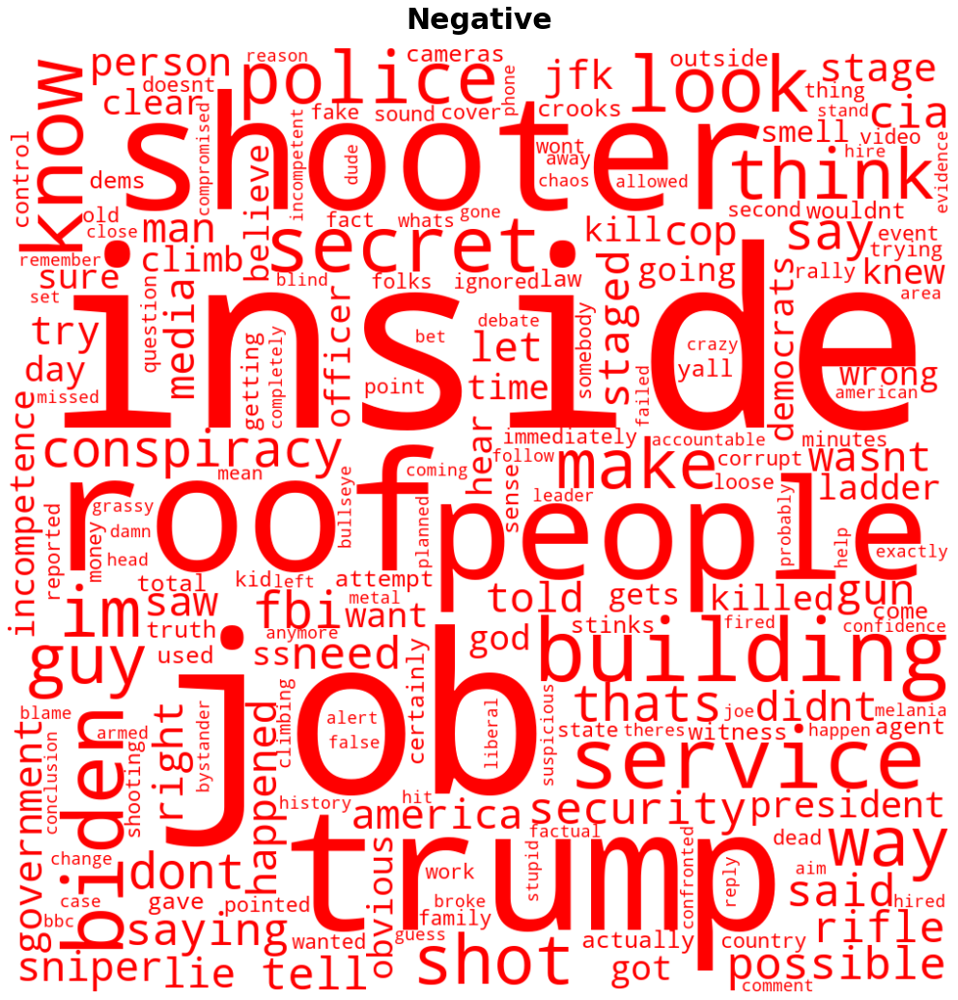

In [24]:
# Wordcloud (Bigram)
generate_sentiment_word_clouds(filtered_df_1, 'bi')

### Word Count Postive

In [25]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_1[filtered_df_1['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

inside: 91 occurrences
job: 91 occurrences
like: 4 occurrences
biden: 2 occurrences
jfk: 2 occurrences
plus: 2 occurrences
security: 2 occurrences
sure: 2 occurrences
trump: 2 occurrences
abc: 1 occurrences
administration: 1 occurrences
agencies: 1 occurrences
ago: 1 occurrences
allowed: 1 occurrences
alphabet: 1 occurrences
apartments: 1 occurrences
ask: 1 occurrences
bb: 1 occurrences
bs: 1 occurrences
bullseyes: 1 occurrences


In [26]:
# Positive Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_1[filtered_df_1['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

inside job: 91 occurrences
job like: 4 occurrences
like jfk: 2 occurrences
abc inside: 1 occurrences
allowed ss: 1 occurrences
alphabet mafia: 1 occurrences
apartments hotels: 1 occurrences
ask nancy: 1 occurrences
bb gun: 1 occurrences
biden administration: 1 occurrences
biden said: 1 occurrences
bullseyes days: 1 occurrences
buy ladder: 1 occurrences
chinese property: 1 occurrences
cia operative: 1 occurrences
clearly inside: 1 occurrences
connected roofs: 1 occurrences
days ago: 1 occurrences
definitely inside: 1 occurrences
democrats want: 1 occurrences


### Word Count Neutral

In [27]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_1[filtered_df_1['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

inside: 45 occurrences
job: 43 occurrences
trump: 9 occurrences
secret: 7 occurrences
service: 7 occurrences
biden: 4 occurrences
dont: 4 occurrences
like: 4 occurrences
calling: 3 occurrences
guy: 3 occurrences
want: 3 occurrences
administration: 2 occurrences
bb: 2 occurrences
best: 2 occurrences
clearly: 2 occurrences
count: 2 occurrences
country: 2 occurrences
crooks: 2 occurrences
cue: 2 occurrences
days: 2 occurrences


In [28]:
# Neutral Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_1[filtered_df_1['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

inside job: 42 occurrences
secret service: 7 occurrences
biden administration: 2 occurrences
clearly inside: 2 occurrences
cue video: 2 occurrences
guy bb: 2 occurrences
illegal immigrants: 2 occurrences
job biden: 2 occurrences
job democrats: 2 occurrences
probably inside: 2 occurrences
trump gave: 2 occurrences
able chill: 1 occurrences
administration imho: 1 occurrences
agents police: 1 occurrences
alarming people: 1 occurrences
alive alarming: 1 occurrences
americans inside: 1 occurrences
anymore inside: 1 occurrences
appointed biden: 1 occurrences
ask mayorkas: 1 occurrences


### Word Count Negative

In [29]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_1[filtered_df_1['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

inside: 97 occurrences
job: 89 occurrences
secret: 23 occurrences
roof: 22 occurrences
service: 22 occurrences
like: 21 occurrences
trump: 20 occurrences
shooter: 18 occurrences
people: 14 occurrences
building: 11 occurrences
look: 11 occurrences
police: 11 occurrences
biden: 10 occurrences
know: 10 occurrences
im: 9 occurrences
think: 9 occurrences
conspiracy: 8 occurrences
dont: 8 occurrences
fbi: 8 occurrences
guy: 8 occurrences


In [30]:
# Negative Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_1[filtered_df_1['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

inside job: 88 occurrences
secret service: 22 occurrences
look like: 6 occurrences
job secret: 5 occurrences
like inside: 4 occurrences
like jfk: 4 occurrences
roof rifle: 4 occurrences
sounds like: 4 occurrences
police secret: 3 occurrences
roof police: 3 occurrences
saw shooter: 3 occurrences
believe inside: 2 occurrences
cia fbi: 2 occurrences
conspiracy thats: 2 occurrences
dont know: 2 occurrences
dont think: 2 occurrences
gone wrong: 2 occurrences
gun roof: 2 occurrences
im waiting: 2 occurrences
inside jobs: 2 occurrences


## **word 2: secret service**

In [31]:
word_to_search = 'secret service'
filtered_df_2 = df_comments[df_comments['preprocessed_text'].str.contains(word_to_search)][['text','preprocessed_text', 'sentiment_category']]
filtered_df_2

,text,preprocessed_text,sentiment_category
8,dont you tell me the lead of secret service ar...,dont tell lead secret service old biden become...,negative
37,I like how the secret service is saying that i...,like secret service saying one million shot co...,negative
45,"One Secret Service Sniper lifts his head, the ...",one secret service sniper lifts head back away...,negative
55,the secret service sniper that was lying down ...,secret service sniper lying ducked cover inste...,negative
60,CONSPIRACY -- Woman to left behind President T...,conspiracy woman left behind president trump w...,negative
...,...,...,...
75552,@dadsc9808 well you see if you listened close...,well see listened closely hear secret service ...,negative
75613,@shannonbarber6161 And get my head blown of...,get head blown secret service thanks,negative
75682,Biden is to stupid to put out a hit it was fro...,biden stupid put hit berry boys like dems kenn...,negative
75762,​ @Itoshimi People being interviewed thought i...,people interviewed thought cap gun firework sa...,negative


In [32]:
df_comments[df_comments['preprocessed_text'].str.contains(word_to_search)]['sentiment_category'].value_counts()

negative    2643
neutral      540
positive     331
Name: sentiment_category, dtype: int64

In [33]:
filtered_df_2[filtered_df_2['sentiment_category'] == 'positive']

,text,preprocessed_text,sentiment_category
104,Secret Service looks like 🤡🤡🤡🤡🙈🙈🙈😂😂😂😂,secret service looks like,positive
193,Secret service in reality 😅,secret service reality,positive
236,Its the Secret Service of Victoria,secret service victoria,positive
318,The secret Service is involved does this story...,secret service involved story sound familiar,positive
349,I think the secret service is involved in this.,think secret service involved,positive
...,...,...,...
74564,Trump 2024 baby 🇺🇸 good work on secret service...,trump baby good work secret service protecting...,positive
74842,Major respect to the secret service not even a...,major respect secret service even minute trump...,positive
74859,Shootings like this happen everyday in America...,shootings like happen everyday america everyon...,positive
74877,Took them forever to get on him. Secret servic...,took forever get secret service fcked,positive


### Wordcloud

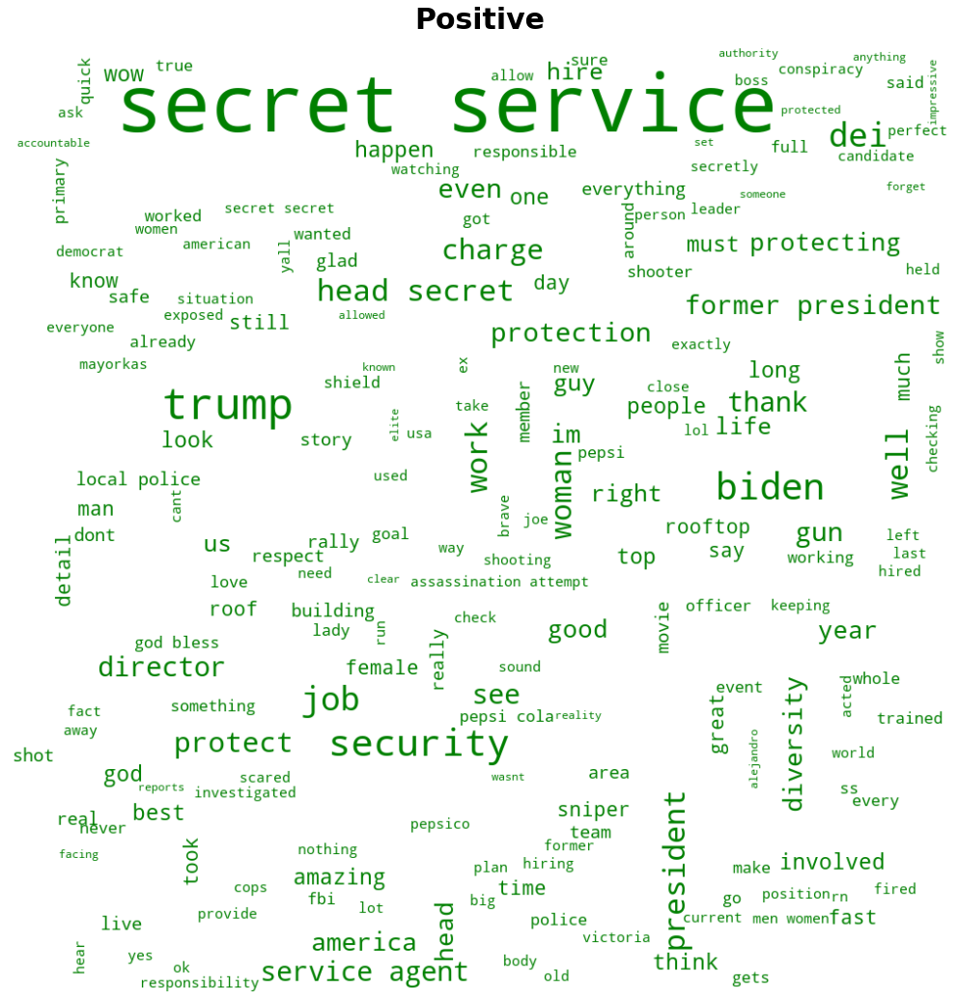

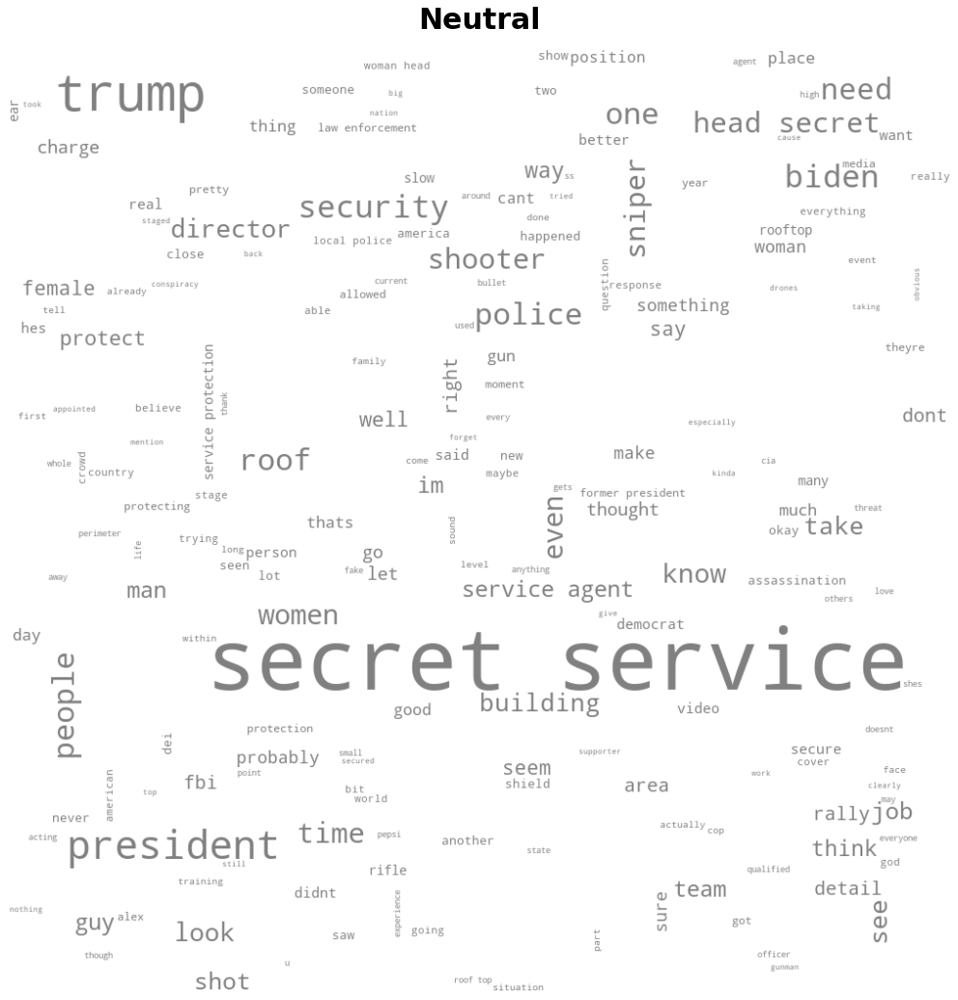

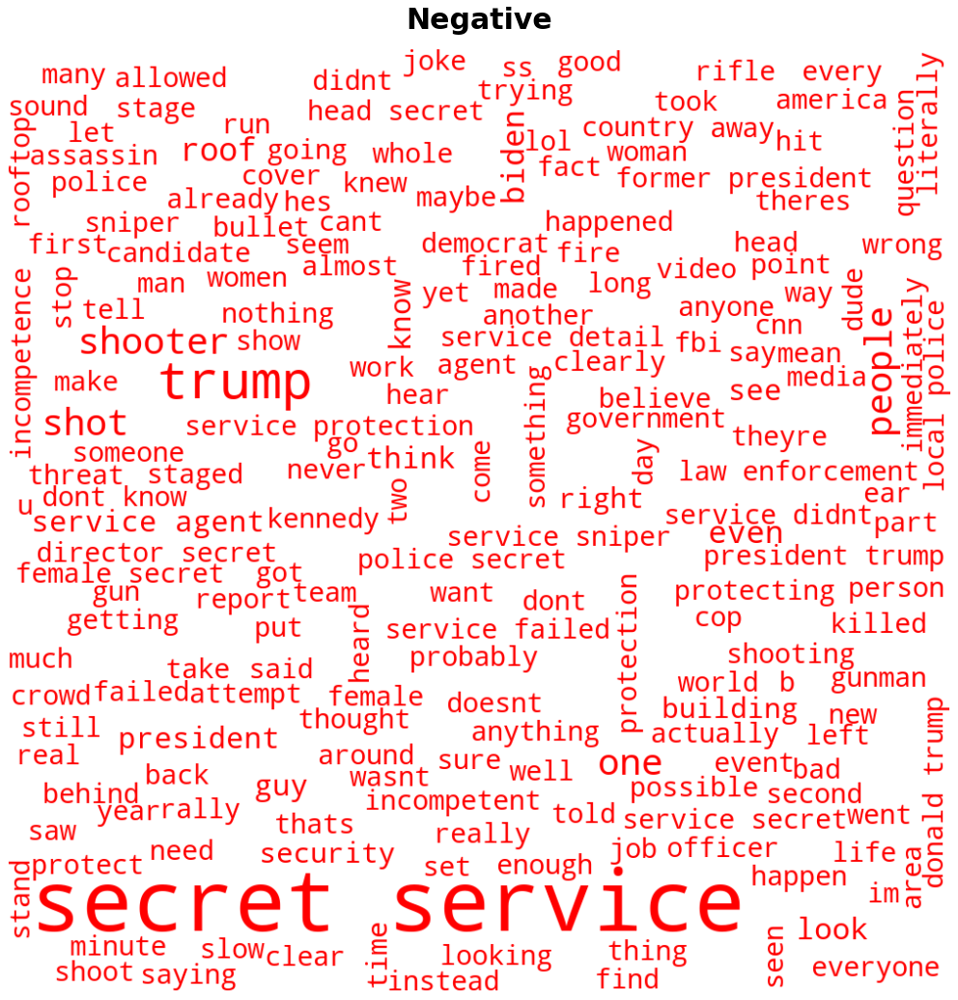

In [34]:
# Wordcloud (Unigram)
generate_sentiment_word_clouds(filtered_df_2, 'uni')

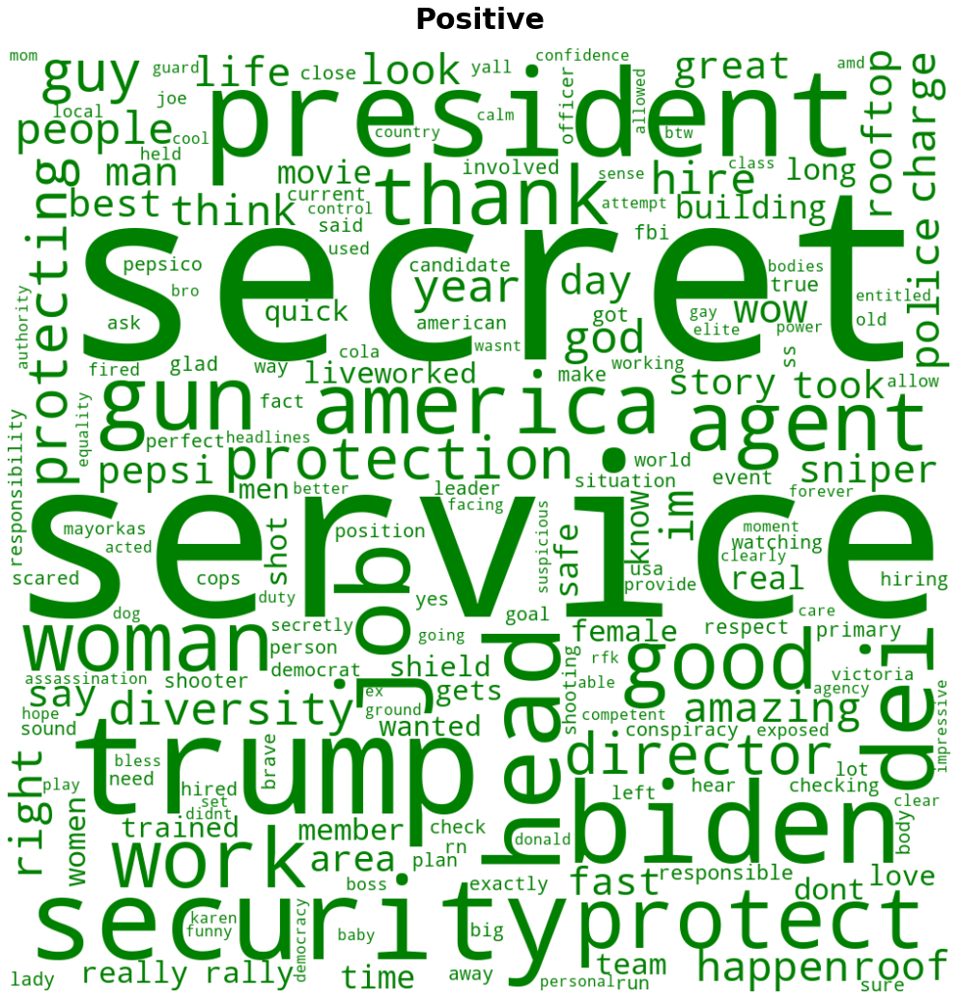

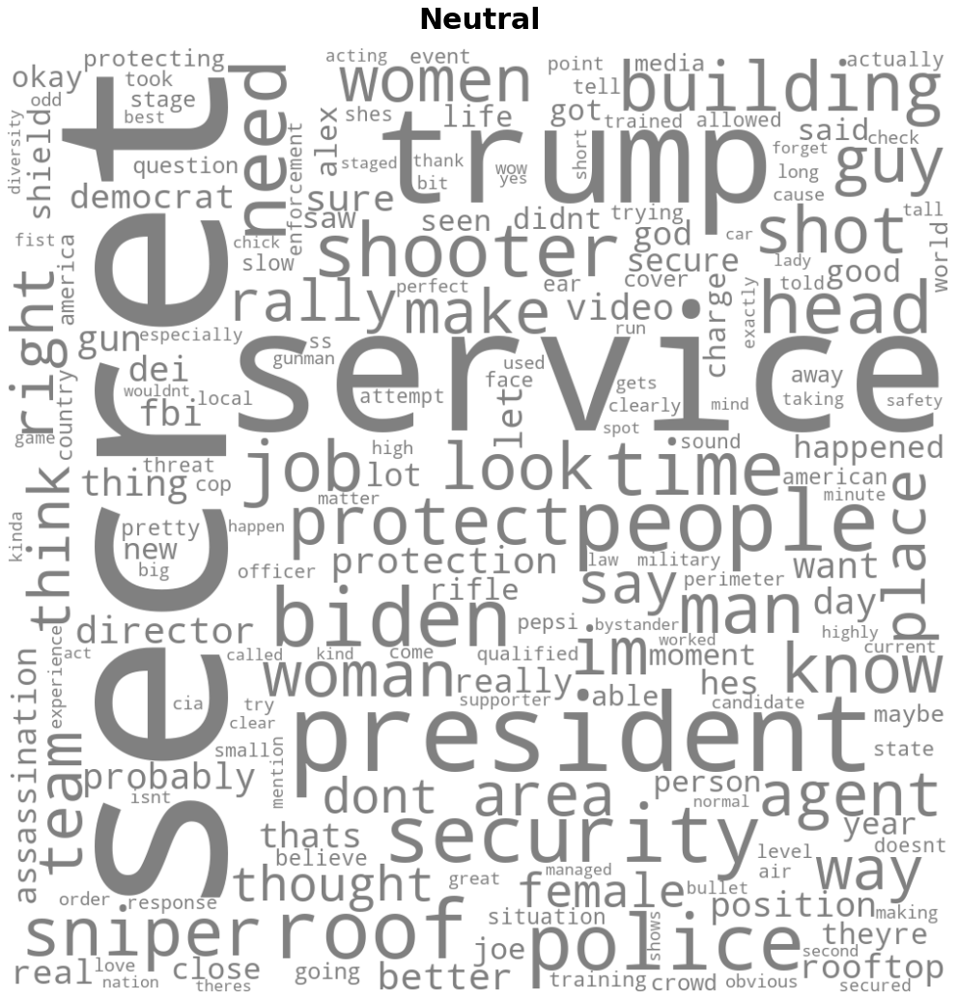

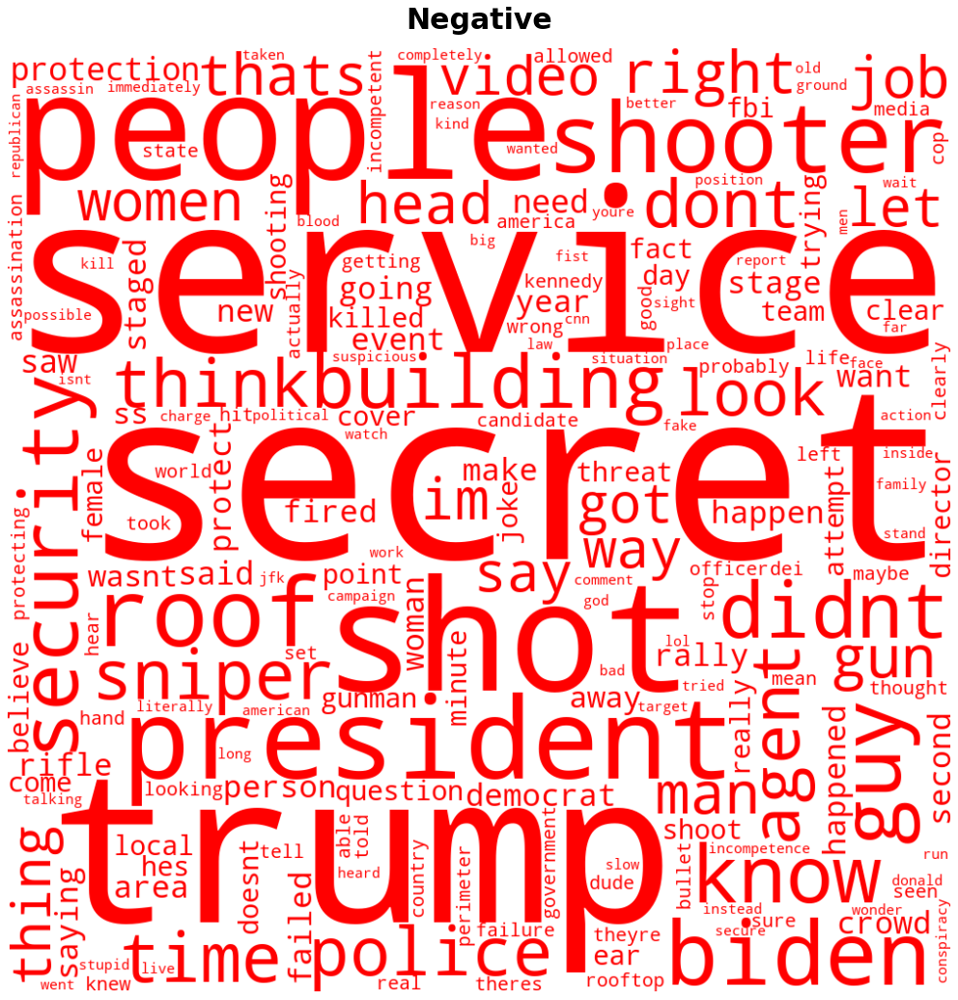

In [35]:
# Wordcloud (Bigram)
generate_sentiment_word_clouds(filtered_df_2, 'bi')

### Word Count Postive

In [36]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_2[filtered_df_2['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

secret: 352 occurrences
service: 338 occurrences
trump: 29 occurrences
head: 23 occurrences
security: 23 occurrences
biden: 18 occurrences
dei: 18 occurrences
job: 17 occurrences
president: 17 occurrences
woman: 14 occurrences
charge: 13 occurrences
like: 13 occurrences
director: 12 occurrences
protect: 12 occurrences
god: 11 occurrences
protection: 11 occurrences
diversity: 10 occurrences
im: 10 occurrences
agents: 9 occurrences
america: 9 occurrences


In [37]:
# Positive Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_2[filtered_df_2['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

secret service: 336 occurrences
head secret: 15 occurrences
dei secret: 8 occurrences
service agents: 8 occurrences
service involved: 7 occurrences
service works: 7 occurrences
charge secret: 6 occurrences
secret services: 6 occurrences
service protection: 6 occurrences
job secret: 5 occurrences
local police: 5 occurrences
service director: 5 occurrences
service secret: 5 occurrences
woman secret: 5 occurrences
bidens secret: 4 occurrences
director secret: 4 occurrences
female secret: 4 occurrences
god bless: 4 occurrences
head security: 4 occurrences
pepsi cola: 4 occurrences


### Word Count Neutral

In [38]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_2[filtered_df_2['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

secret: 589 occurrences
service: 576 occurrences
trump: 109 occurrences
president: 64 occurrences
like: 50 occurrences
head: 47 occurrences
police: 43 occurrences
roof: 38 occurrences
security: 37 occurrences
woman: 37 occurrences
people: 35 occurrences
job: 33 occurrences
biden: 32 occurrences
man: 28 occurrences
protect: 28 occurrences
women: 28 occurrences
director: 25 occurrences
time: 25 occurrences
shooter: 24 occurrences
im: 22 occurrences


In [39]:
# Neutral Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_2[filtered_df_2['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

secret service: 565 occurrences
head secret: 30 occurrences
secret services: 13 occurrences
service agent: 13 occurrences
service protection: 12 occurrences
charge secret: 10 occurrences
director secret: 10 occurrences
female secret: 10 occurrences
law enforcement: 10 occurrences
service police: 10 occurrences
local police: 9 occurrences
police secret: 9 occurrences
service agents: 9 occurrences
service director: 9 occurrences
woman head: 9 occurrences
women secret: 9 occurrences
service roof: 7 occurrences
service sniper: 7 occurrences
service woman: 7 occurrences
agency coz: 6 occurrences


### Word Count Negative

In [40]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_2[filtered_df_2['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

secret: 3059 occurrences
service: 2961 occurrences
trump: 841 occurrences
like: 341 occurrences
roof: 341 occurrences
people: 318 occurrences
shooter: 299 occurrences
president: 286 occurrences
shot: 264 occurrences
police: 229 occurrences
didnt: 210 occurrences
dont: 210 occurrences
biden: 208 occurrences
security: 205 occurrences
know: 195 occurrences
think: 170 occurrences
guy: 160 occurrences
head: 158 occurrences
protection: 152 occurrences
man: 147 occurrences


In [41]:
# Negative Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_2[filtered_df_2['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

secret service: 2930 occurrences
service agents: 92 occurrences
service protection: 76 occurrences
service failed: 70 occurrences
secret services: 69 occurrences
service agent: 63 occurrences
head secret: 62 occurrences
service sniper: 56 occurrences
law enforcement: 55 occurrences
president trump: 55 occurrences
police secret: 54 occurrences
director secret: 50 occurrences
service didnt: 48 occurrences
donald trump: 45 occurrences
dont know: 41 occurrences
looks like: 41 occurrences
female secret: 40 occurrences
local police: 40 occurrences
service snipers: 40 occurrences
shots fired: 40 occurrences


## **word 3: president trump**

In [42]:
word_to_search = 'president trump'
filtered_df_3 = df_comments[df_comments['preprocessed_text'].str.contains(word_to_search)][['text','preprocessed_text', 'sentiment_category']]
filtered_df_3

,text,preprocessed_text,sentiment_category
26,Inside job. The political left the so-called D...,inside job political left socalled democrats t...,negative
60,CONSPIRACY -- Woman to left behind President T...,conspiracy woman left behind president trump w...,negative
143,Ex president trump voted worst president in t...,ex president trump voted worst president histo...,negative
159,President Trump? He elected already?,president trump elected already,neutral
170,00:38 she already said president trump lol 😅,already said president trump lol,negative
...,...,...,...
75402,The Democrat's have been posting on YT for Bid...,democrats posting yt biden take president trum...,negative
75453,Prayers for protection for President Trump.,prayers protection president trump,positive
75461,Vice president trump drrrrrrrr,vice president trump drrrrrrrr,positive
75468,NOW HE'S DEFINITELY GONNA BE PRESIDENT ..TRUMP...,hes definitely gonna president trump,neutral


In [43]:
df_comments[df_comments['preprocessed_text'].str.contains(word_to_search)]['sentiment_category'].value_counts()

negative    436
positive    240
neutral     196
Name: sentiment_category, dtype: int64

In [44]:
filtered_df_3[filtered_df_3['sentiment_category'] == 'positive']

,text,preprocessed_text,sentiment_category
952,Democrats have ensured that Trump is now the p...,democrats ensured trump peoples president trum...,positive
5189,Great video!! I hadn’t seen all this. God prot...,great video hadnt seen god protect president t...,positive
6163,"According to Biden, he's Vice President Trump.",according biden hes vice president trump,positive
6603,Prayers for my President Trump! God please pro...,prayers president trump god please protect pre...,positive
7363,Exactly what President Trump said “look what’s...,exactly president trump said look whats happen...,positive
...,...,...,...
73088,"""Lord, thank you for sparing the life of Presi...",lord thank sparing life president trump thank ...,positive
73091,"""Lord, thank you for sparing the life of Presi...",lord thank sparing life president trump thank ...,positive
74227,Nice script president Trump 👍🏻,nice script president trump,positive
75453,Prayers for protection for President Trump.,prayers protection president trump,positive


### Wordcloud

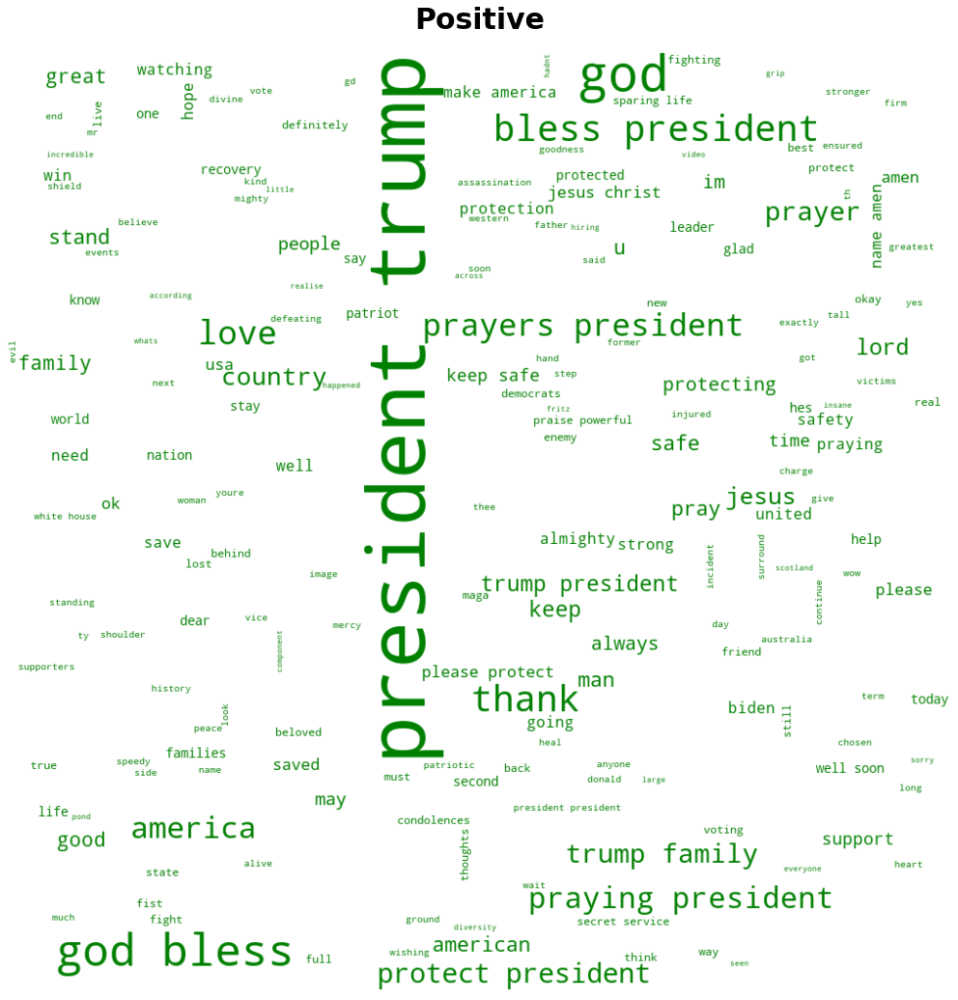

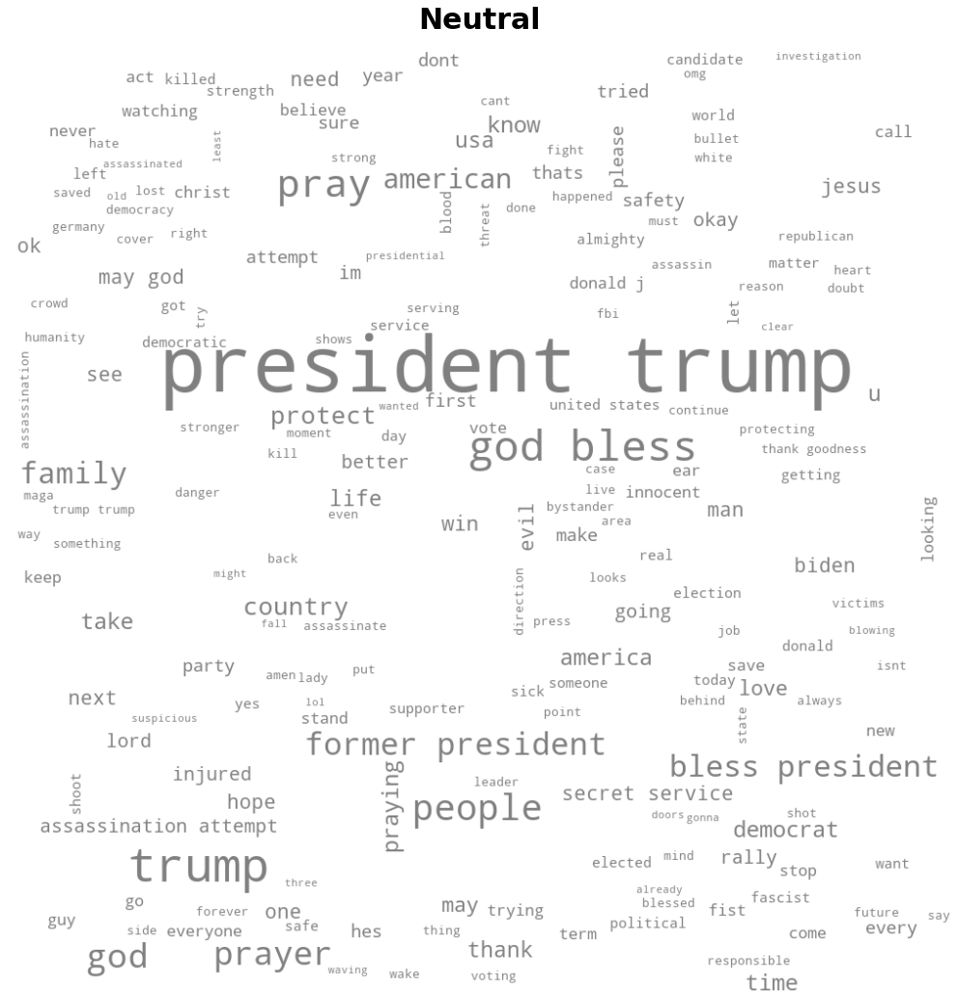

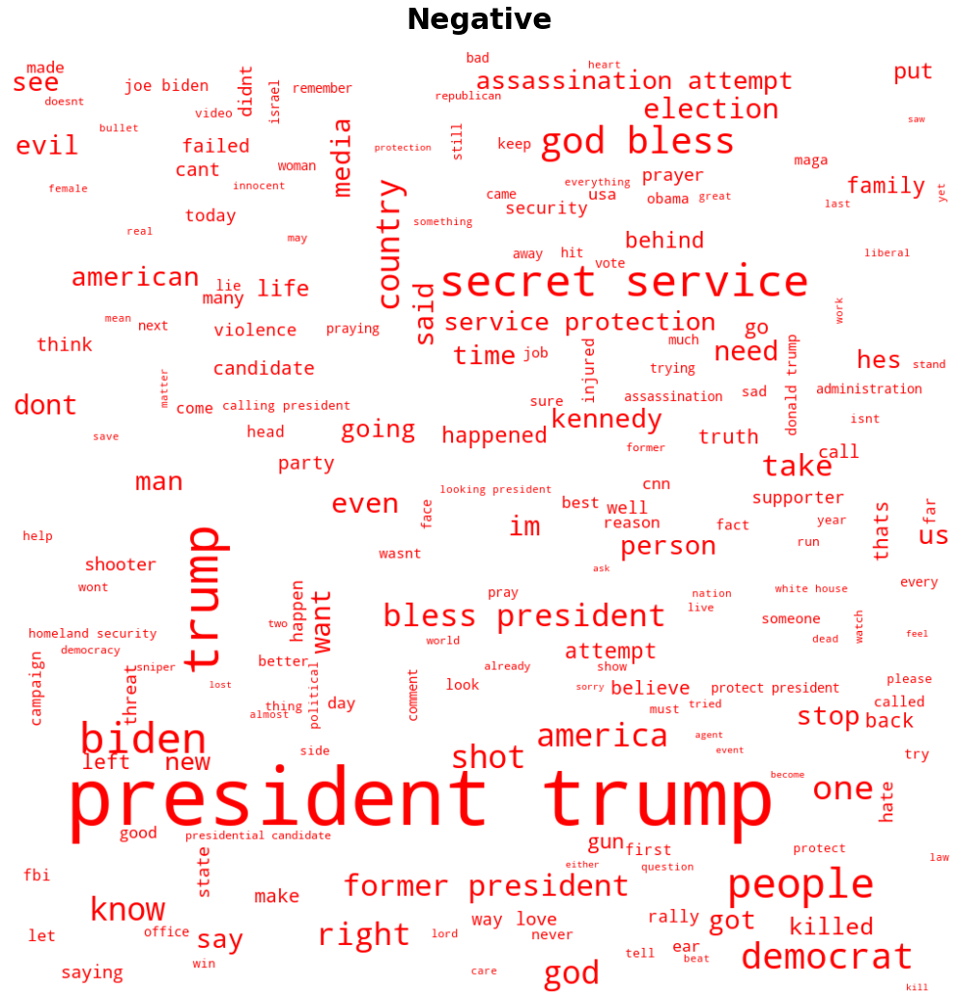

In [45]:
# Wordcloud (Unigram)
generate_sentiment_word_clouds(filtered_df_3, 'uni')

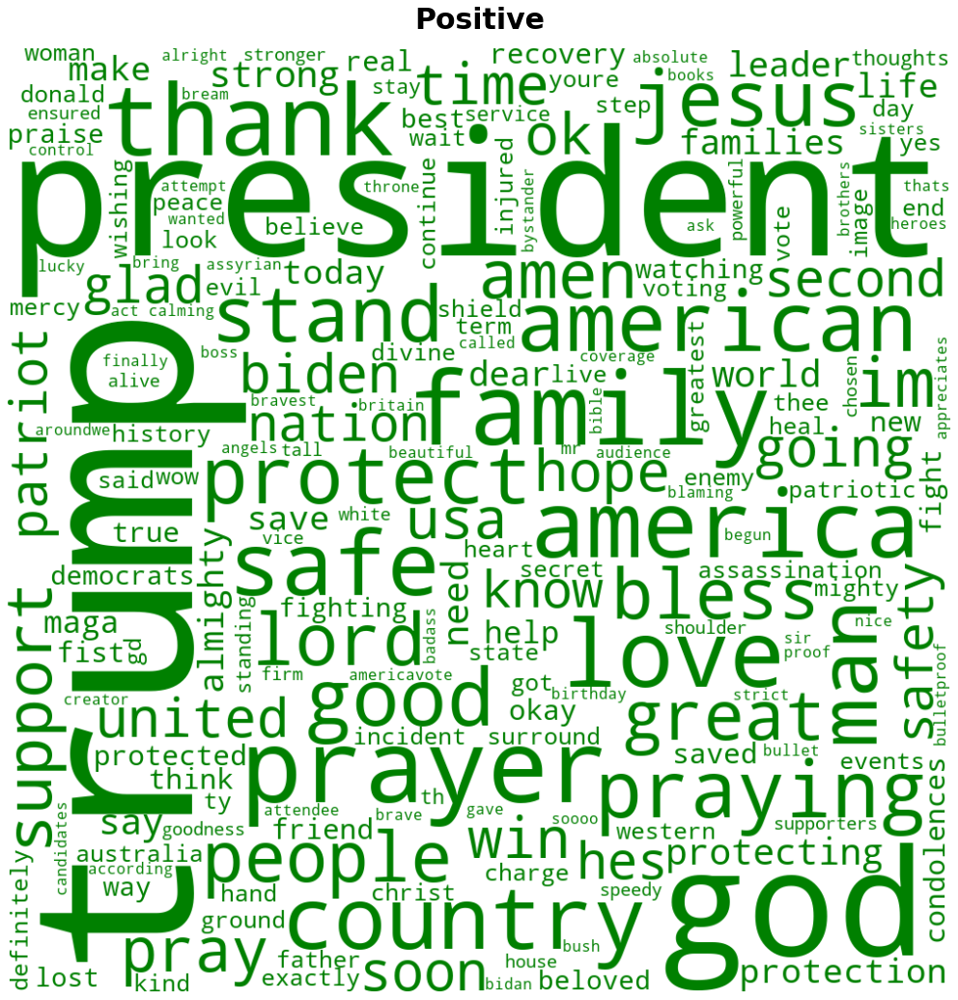

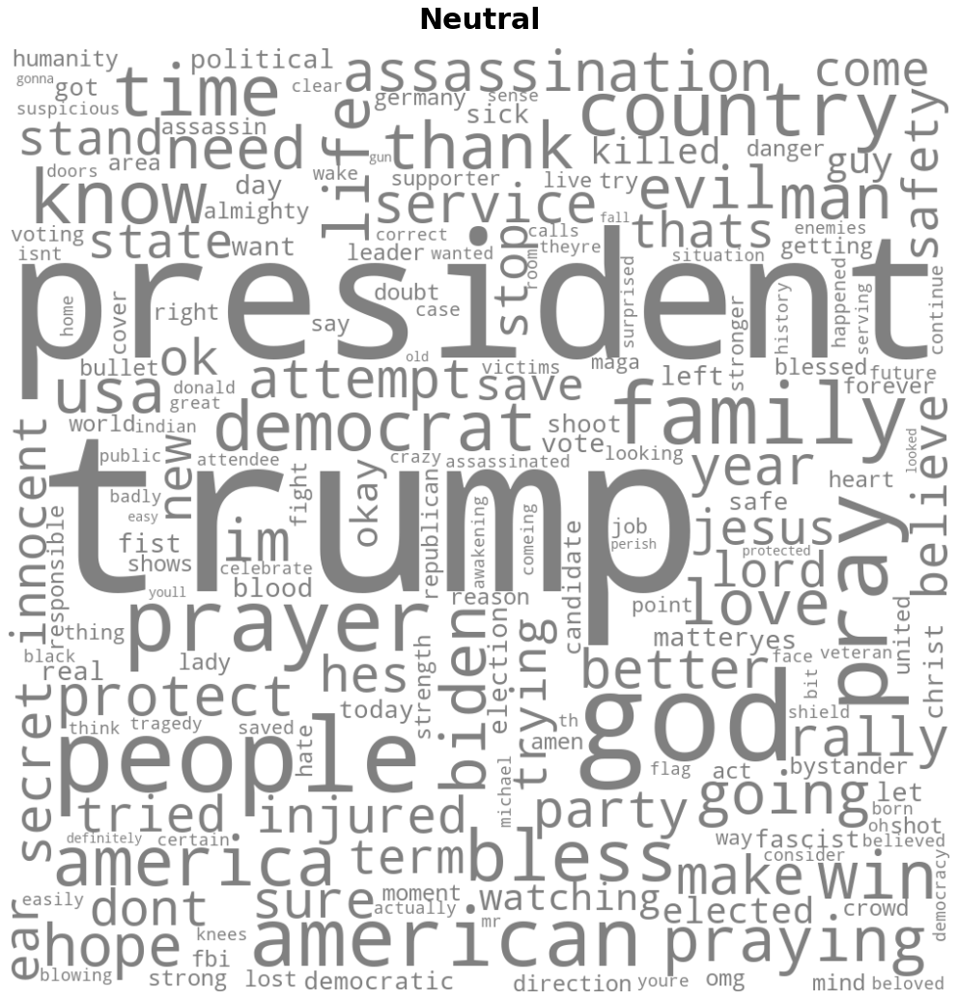

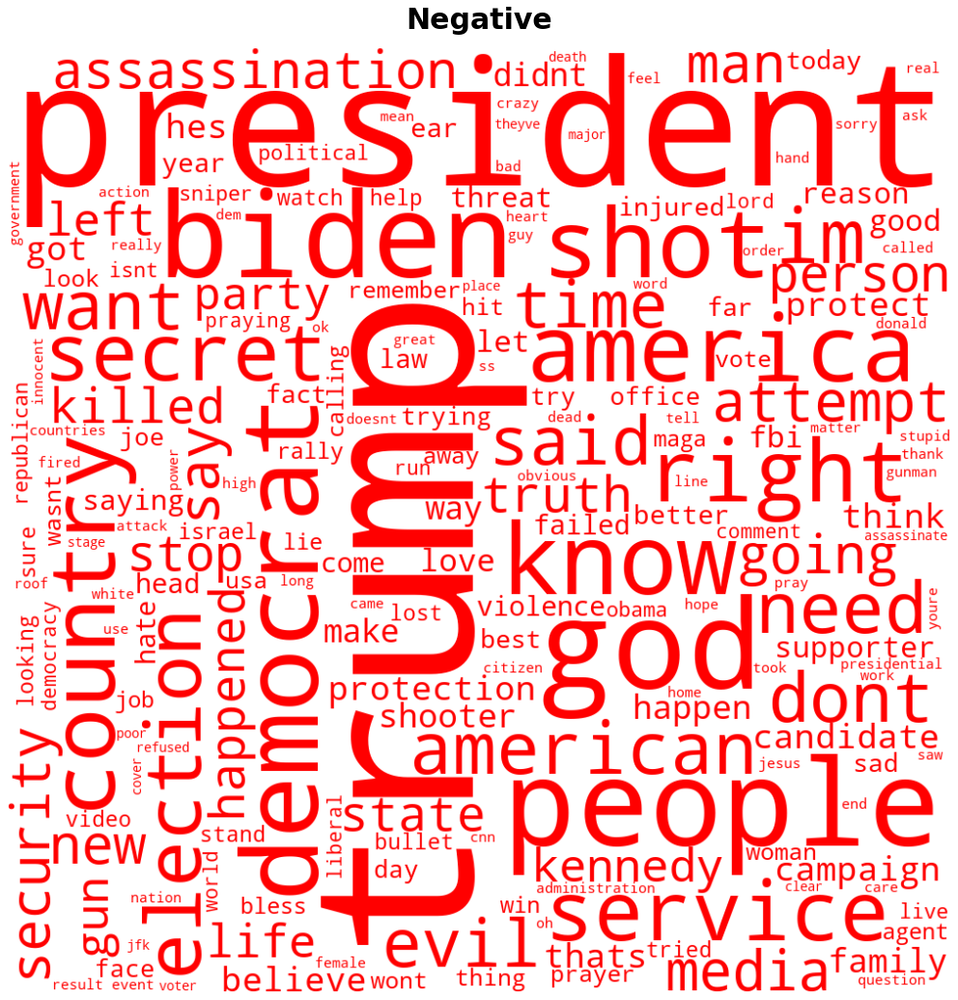

In [46]:
# Wordcloud (Bigram)
generate_sentiment_word_clouds(filtered_df_3, 'bi')

### Word Count Postive

In [47]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_3[filtered_df_3['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

president: 271 occurrences
trump: 264 occurrences
god: 112 occurrences
bless: 54 occurrences
prayers: 39 occurrences
america: 27 occurrences
protect: 27 occurrences
family: 26 occurrences
praying: 26 occurrences
thank: 24 occurrences
love: 23 occurrences
jesus: 20 occurrences
safe: 18 occurrences
country: 15 occurrences
lord: 13 occurrences
amen: 11 occurrences
man: 11 occurrences
pray: 11 occurrences
good: 10 occurrences
great: 10 occurrences


In [48]:
# Positive Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_3[filtered_df_3['sentiment_category']=='positive']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

president trump: 243 occurrences
god bless: 49 occurrences
bless president: 31 occurrences
prayers president: 25 occurrences
praying president: 22 occurrences
protect president: 19 occurrences
trump family: 16 occurrences
trump god: 16 occurrences
love president: 12 occurrences
god protect: 10 occurrences
pray president: 9 occurrences
bless america: 8 occurrences
bless protect: 7 occurrences
thank god: 7 occurrences
god president: 6 occurrences
jesus christ: 6 occurrences
trump love: 6 occurrences
trump president: 6 occurrences
trump thank: 6 occurrences
america great: 5 occurrences


### Word Count Neutral

In [49]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_3[filtered_df_3['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

trump: 250 occurrences
president: 244 occurrences
god: 66 occurrences
bless: 40 occurrences
pray: 29 occurrences
people: 24 occurrences
prayers: 21 occurrences
family: 18 occurrences
like: 17 occurrences
country: 13 occurrences
protect: 13 occurrences
attempt: 12 occurrences
service: 12 occurrences
america: 11 occurrences
american: 11 occurrences
praying: 11 occurrences
thank: 11 occurrences
trumps: 11 occurrences
assassination: 10 occurrences
democrats: 10 occurrences


In [50]:
# Neutral Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_3[filtered_df_3['sentiment_category']=='neutral']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

president trump: 203 occurrences
god bless: 35 occurrences
bless president: 20 occurrences
prayers president: 13 occurrences
pray president: 12 occurrences
donald trump: 9 occurrences
protect president: 9 occurrences
president trumps: 8 occurrences
secret service: 8 occurrences
assassination attempt: 7 occurrences
president donald: 7 occurrences
praying president: 6 occurrences
trump family: 6 occurrences
trump god: 6 occurrences
trump president: 6 occurrences
american people: 5 occurrences
attempt president: 5 occurrences
god protect: 5 occurrences
looking president: 5 occurrences
trump ok: 5 occurrences


### Word Count Negative

In [51]:
# Example usage
most_common_unigrams = count_unigrams(filtered_df_3[filtered_df_3['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common unigrams and their counts
for unigram, count in most_common_unigrams:
    print(f'{unigram}: {count} occurrences')

trump: 597 occurrences
president: 571 occurrences
god: 120 occurrences
service: 102 occurrences
biden: 95 occurrences
secret: 94 occurrences
people: 86 occurrences
bless: 67 occurrences
like: 62 occurrences
democrats: 53 occurrences
know: 48 occurrences
country: 47 occurrences
america: 45 occurrences
attempt: 45 occurrences
protection: 45 occurrences
right: 45 occurrences
assassination: 42 occurrences
dont: 40 occurrences
im: 40 occurrences
shot: 40 occurrences


In [52]:
# Negative Comment
# Count bigrams in the 'updated_text'
most_common_bigrams = count_bigrams(filtered_df_3[filtered_df_3['sentiment_category']=='negative']['preprocessed_text'].astype(str))

# Display the most common bigrams and their counts
for bigram, count in most_common_bigrams:
    print(f'{bigram}: {count} occurrences')

president trump: 456 occurrences
secret service: 94 occurrences
god bless: 62 occurrences
bless president: 44 occurrences
assassination attempt: 26 occurrences
service protection: 26 occurrences
president trumps: 23 occurrences
trump president: 17 occurrences
attempt president: 14 occurrences
joe biden: 14 occurrences
calling president: 12 occurrences
donald trump: 12 occurrences
homeland security: 12 occurrences
protect president: 12 occurrences
looking president: 11 occurrences
white house: 10 occurrences
fight fight: 9 occurrences
prayers president: 9 occurrences
thank god: 9 occurrences
trump god: 9 occurrences


# Export to Excel and csv

In [59]:
# # Create a Pandas Excel writer using XlsxWriter as the engine.
# with pd.ExcelWriter('filtered_df.xlsx', engine='xlsxwriter') as writer:
#     # Write each DataFrame to a different sheet.
#     filtered_df_1.to_excel(writer, sheet_name='w1 inside job', index=False)
#     filtered_df_2.to_excel(writer, sheet_name='w2 secret service', index=False)
#     filtered_df_3.to_excel(writer, sheet_name='w3 president trump', index=False)